# Clustering & Classification

1. Load and Standardize data
2. Run PCA
3. Run t-SNE
4. Run UMAP
5. Run classification: SVM
6. Run classification: k-NN

In [17]:
import pandas as pd
import numpy as np

from sklearn.decomposition import PCA
from sklearn.model_selection import ParameterGrid
from sklearn.cluster import KMeans
from sklearn.manifold import trustworthiness
from sklearn import metrics
from sklearn.utils import resample
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from sklearn import svm


import matplotlib.pyplot as plt

import json
import mplcursors

from sklearn.manifold import TSNE

from umap.umap_ import UMAP

import plotly.express as px

import warnings
warnings.filterwarnings('ignore')


Create two dictionaries, where the keys are the teams and the values are whether the team finished in the top half and their league position

In [3]:
top_half_dict = {1625: 1, 1611: 1, 1624: 1, 1612: 1, 1610: 1, 1609: 1, 1646: 1, 1623: 1, 1631: 1, 1613: 1
                , 1628: 0, 1659: 0, 1633: 0, 1644: 0, 1651: 0, 1673: 0, 1619: 0, 10531: 0, 1639: 0, 1627: 0
                , 676: 1, 679: 1, 675: 1, 674: 1, 682: 1, 684: 1, 680: 1, 698: 1, 701: 1, 756: 1
                , 691: 0, 687: 0, 692: 0, 696: 0, 695: 0, 678: 0, 712: 0, 677: 0, 714: 0, 683: 0
                , 2444: 1, 2449: 1, 2482: 1, 2447: 1, 2446: 1, 2975: 1, 2445: 1, 2462: 1, 2454: 1
                , 2457: 0, 2443: 0, 2481: 0, 2455: 0, 2460: 0, 2453: 0, 2451: 0, 2450: 0, 2463: 0
                , 3159: 1, 3187: 1, 3158: 1, 3161: 1, 3162: 1, 3157: 1, 3172: 1, 3176: 1, 3185: 1, 3164: 1
                , 3315: 0, 3193: 0, 3165: 0, 3163: 0, 3166: 0, 3173: 0, 3204: 0, 3197: 0, 3194: 0, 3219: 0
                , 3767: 1, 19830: 1, 3766: 1, 3771: 1, 3774: 1, 3772: 1, 3782: 1, 3775: 1, 3770: 1, 3787: 1
                , 3804: 0, 3785: 0, 3789: 0, 3799: 0, 3779: 0, 3783: 0, 3776: 0, 3780: 0, 3795: 0, 3777: 0}

top_half_df = pd.DataFrame(top_half_dict.items(), columns=['team_id', 'top_half'])

league_position_dict = {1625: 1, 1611: 2, 1624: 3, 1612: 4, 1610: 5, 1609: 6, 1646: 7, 1623: 8, 1631: 9, 1613: 10
                , 1628: 11, 1659: 12, 1633: 13, 1644: 14, 1651: 15, 1673: 16, 1619: 17, 10531: 18, 1639: 19, 1627: 20
                , 676: 1, 679: 2, 675: 3, 674: 4, 682: 5, 684: 6, 680: 7, 698: 8, 701: 9, 756: 10
                , 691:11, 687: 12, 692: 13, 696: 14, 695: 15, 678: 16, 712: 17, 677: 18, 714: 19, 683: 20
                , 2444: 1, 2449: 2, 2482: 3, 2447: 4, 2446: 5, 2975: 6, 2445: 7, 2462: 8, 2454: 9
                , 2457: 10, 2443: 11, 2481: 12, 2455: 13, 2460: 14, 2453: 15, 2451: 16, 2450: 17, 2463: 18
                , 3159: 1, 3187: 2, 3158: 3, 3161: 4, 3162: 5, 3157: 6, 3172: 7, 3176: 8, 3185: 9, 3164: 10
                , 3315: 11, 3193: 12, 3165: 13, 3163: 14, 3166: 15, 3173: 16, 3204: 17, 3197: 18, 3194: 19, 3219: 20
                , 3767: 1, 19830: 2, 3766: 3, 3771: 4, 3774: 5, 3772: 6, 3782: 7, 3775: 8, 3770: 9, 3787: 10
                , 3804: 11, 3785: 12, 3789: 13, 3799: 14, 3779: 15, 3783: 16, 3776: 17, 3780: 18, 3795: 19, 3777: 20}

league_position_df = pd.DataFrame(league_position_dict.items(), columns=['team_id', 'league_position'])

teams_dict = {}
with open("../Data/meta/teams.json") as f:
        teams = json.load(f)
        for team in teams:
            if team['type'] == 'club':
                teams_dict[team['wyId']] = team['name']

teams_df = pd.DataFrame(teams_dict.items(), columns=['team_id', 'team_name'])

Read in centrality scores and combine

In [4]:
# loading dataset
df_england = pd.read_csv("../Data/output/centralities/centralities_players_england.csv")
df_england['league'] = 0
# checking data shape
row, col = df_england.shape
print(f'There are {row} rows and {col} columns') 



There are 20 rows and 28 columns


In [5]:
# loading dataset
df_spain = pd.read_csv("../Data/output/centralities/centralities_players_spain.csv")
df_spain['league'] = 1
# checking data shape
row, col = df_spain.shape
print(f'There are {row} rows and {col} columns') 



There are 20 rows and 28 columns


In [6]:
# loading dataset
df_germany = pd.read_csv("../Data/output/centralities/centralities_players_germany.csv")
df_germany['league'] = 2
# checking data shape
row, col = df_germany.shape
print(f'There are {row} rows and {col} columns') 



There are 18 rows and 28 columns


In [7]:
# loading dataset
df_france = pd.read_csv("../Data/output/centralities/centralities_players_france.csv")
df_france['league'] = 4
# checking data shape
row, col = df_france.shape
print(f'There are {row} rows and {col} columns') 



There are 20 rows and 28 columns


In [8]:
# loading dataset
df_italy = pd.read_csv("../Data/output/centralities/centralities_players_italy.csv")
df_italy['league'] = 3
# checking data shape
row, col = df_italy.shape
print(f'There are {row} rows and {col} columns') 



There are 20 rows and 28 columns


In [9]:
df_all = pd.concat([df_england, df_spain, df_france, df_germany, df_italy])
df_all = pd.merge(df_all, top_half_df, on='team_id', how='left')
df_all = pd.merge(df_all, teams_df, on='team_id', how='left')
df_all = pd.merge(df_all, league_position_df, on='team_id', how='left')
df_all.tail(5)

,team_id,in_degree,out_degree,total_degree,avg_total_degree,med_in_degree,med_out_degree,max_total_degree,max_in_degree,max_out_degree,...,pagerank,avg_pagerank,max_pagerank,max_pagerank_pos,max_clique,max_cliques,league,top_half,team_name,league_position
93,3204,[0. 0. 1. 0. 3. 4. 0. 0. 3. 2. 0.],[0. 0. 2. 0. 3. 1. 0. 1. 2. 4. 0.],"[0.0, 0.0, 3.0, 0.0, 6.0, 5.0, 0.0, 1.0, 5.0, ...",1.444444,0,1,6,4,4,...,"{0: 0.0754188987722016, 1: 0.0754188987722016,...",0.086096,0.120467,4,2,"[[2, 5], [4, 9]]",3,0,SPAL,17
94,3315,[2. 0. 3. 3. 4. 4. 5. 5. 4. 7. 0.],[2. 0. 5. 3. 5. 4. 6. 2. 4. 6. 0.],"[4.0, 0.0, 8.0, 6.0, 9.0, 8.0, 11.0, 7.0, 8.0,...",4.111111,4,4,13,7,6,...,"{0: 0.08789727713757017, 1: 0.0746400664720677...",0.090434,0.109399,6,2,"[[0, 2], [2, 9], [4, 5], [6, 8], [6, 9], [6, 3...",3,0,Sassuolo,11
95,3194,[0. 1. 0. 3. 2. 1. 4. 2. 2. 2. 0.],[0. 1. 0. 1. 1. 3. 2. 4. 2. 3. 0.],"[0.0, 2.0, 0.0, 4.0, 3.0, 4.0, 6.0, 6.0, 4.0, ...",1.888889,2,1,6,4,4,...,"{0: 0.07342773267456461, 1: 0.1002348939368870...",0.093093,0.108699,5,2,"[[3, 8], [6, 9]]",3,0,Hellas Verona,19
96,3193,[ 4. 4. 2. 5. 5. 4. 5. 5. 13. 8. 0.],[ 4. 5. 2. 5. 6. 4. 4. 6. 10. 9. 0.],"[8.0, 9.0, 4.0, 10.0, 11.0, 8.0, 9.0, 11.0, 23...",6.111111,5,5,23,13,10,...,"{0: 0.08794911042480731, 1: 0.0915408717692674...",0.091541,0.103791,8,3,"[[8, 4, 9], [8, 4, 5]]",3,0,Genoa,12
97,3197,[ 2. 2. 0. 1. 1. 5. 2. 4. 12. 9. 0.],[4. 3. 4. 2. 1. 4. 1. 4. 9. 5. 1.],"[6.0, 5.0, 4.0, 3.0, 2.0, 9.0, 3.0, 8.0, 21.0,...",4.222222,2,4,21,12,9,...,"{0: 0.08303788476021387, 1: 0.0853204037968396...",0.084391,0.119768,8,2,"[[5, 9], [6, 9], [8, 0], [8, 1], [8, 9], [8, 7]]",3,0,Crotone,18


In [132]:
df_all.to_csv("../Data/output/centralities/centralities_players_all.csv")

# Run for only max centrality values

In [10]:
features_max = df_all[['max_total_degree', 'max_in_degree', 'max_out_degree', 'max_clustering_coef', 'max_betweenness', 'max_pagerank', 'max_clique']]
features_max_norm=(features_max-features_max.mean())/features_max.std()


# PCA

In [12]:
pca_2 = PCA(n_components=2)
pca_2_result = pca_2.fit_transform(features_max_norm)
print('Explained variation per principal component: {}'.format(pca_2.explained_variance_ratio_))

print('Cumulative variance explained by 2 principal components: {:.2%}'.format(np.sum(pca_2.explained_variance_ratio_)))



Explained variation per principal component: [0.64149306 0.13533769]
Cumulative variance explained by 2 principal components: 77.68%


In [13]:
dataset_pca = pd.DataFrame(abs(pca_2.components_), columns=features_max_norm.columns, index=['PC_1', 'PC_2'])
print('\n\n', dataset_pca)



       max_total_degree  max_in_degree  max_out_degree  max_clustering_coef  \
PC_1          0.461325       0.454505        0.452548             0.186153   
PC_2          0.010934       0.030012        0.012353             0.746869   

      max_betweenness  max_pagerank  max_clique  
PC_1         0.207023      0.334295    0.431903  
PC_2         0.658299      0.075143    0.044837  


In [14]:
print("\n*************** Most important features *************************")
print('As per PC 1:\n', (dataset_pca[dataset_pca > 0.3].iloc[0]).dropna())   
print('\n\nAs per PC 2:\n', (dataset_pca[dataset_pca > 0.3].iloc[1]).dropna())
print("\n******************************************************************")


*************** Most important features *************************
As per PC 1:
 max_total_degree    0.461325
max_in_degree       0.454505
max_out_degree      0.452548
max_pagerank        0.334295
max_clique          0.431903
Name: PC_1, dtype: float64


As per PC 2:
 max_clustering_coef    0.746869
max_betweenness        0.658299
Name: PC_2, dtype: float64

******************************************************************


In [15]:
pca = PCA(2)
data = pca.fit_transform(features_max_norm)

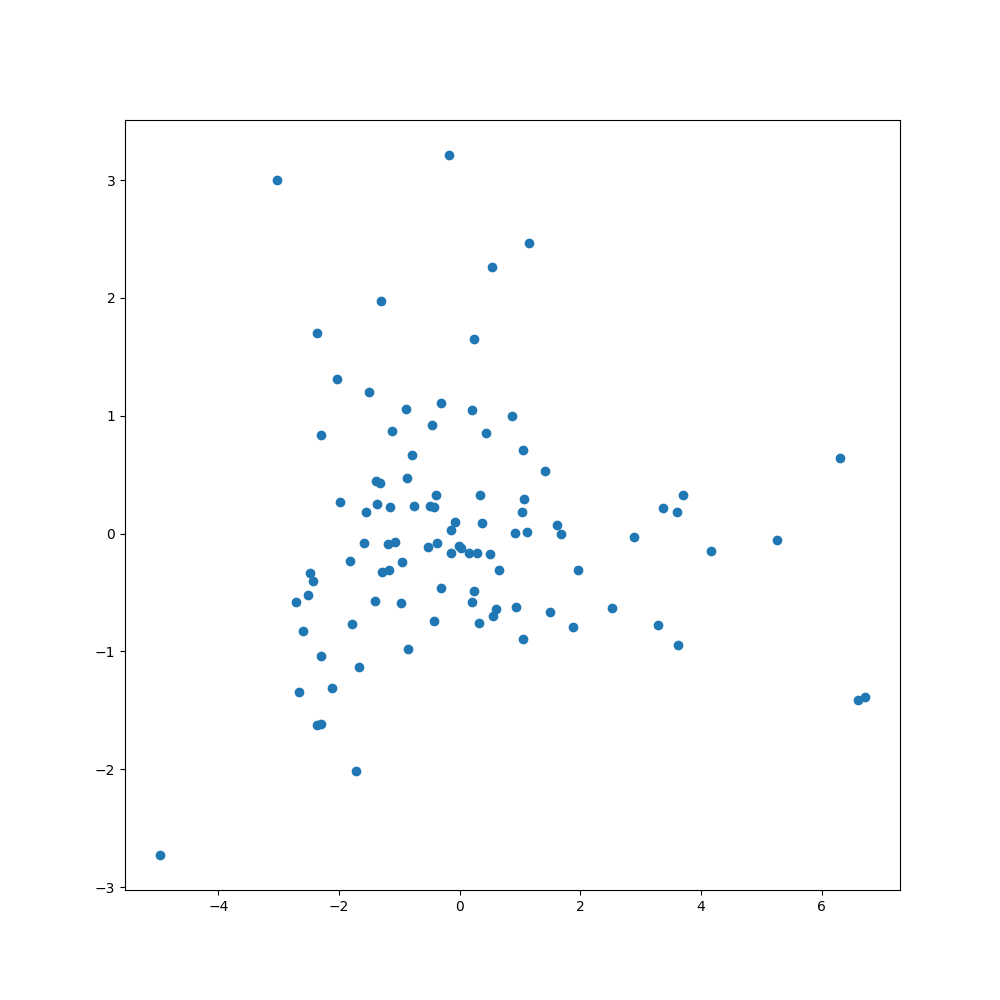

In [16]:
%matplotlib widget
team_names = df_all['team_name'].to_list()
x = data[:,0]
y = data[:,1]
size=81
cmap = plt.cm.viridis
plt.figure(figsize=(10,10))

plt.scatter(x, y)

# # Loop for annotation of all points 
# for i in range(len(team_names)): 
#     plt.annotate(team_names[i], (x[i], y[i] + 0.01), size=24) 
mplcursors.cursor(multiple = True).connect(
    "add", lambda sel: sel.annotation.set_text(
          team_names[sel.target.index]
))
plt.show()

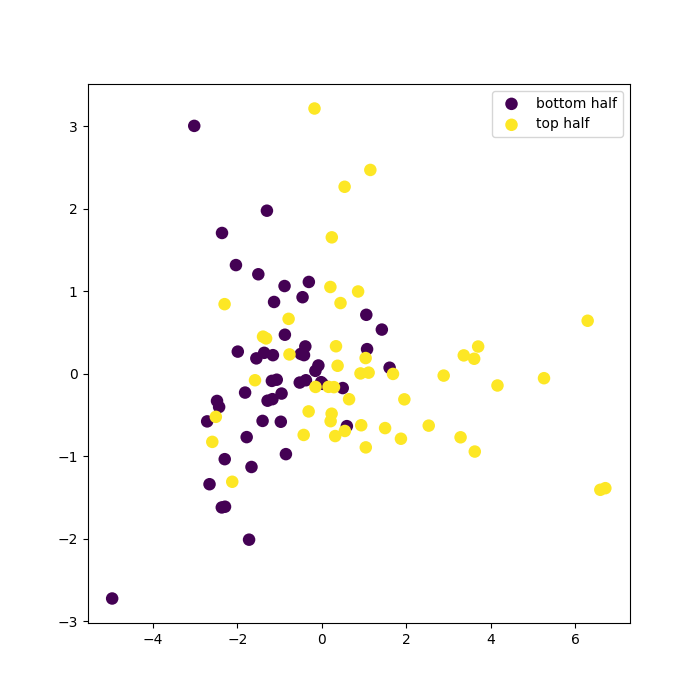

In [17]:
df = pd.DataFrame({"x":data[:, 0].flatten(), 
                   "y":data[:, 1].flatten(), 
                   "colors":np.array(df_all['top_half'].to_list()).flatten()})
size=81
cmap = plt.cm.viridis
norm = plt.Normalize(df['colors'].values.min(), df['colors'].values.max())

labels = ['bottom half', 'top half']

plt.figure(figsize=(7,7))
for i, dff in df.groupby("colors"):
    plt.scatter(dff['x'], dff['y'], s=size, c=cmap(norm(dff['colors'])), 
                edgecolors='none', label=labels[i])

plt.legend()
plt.show()

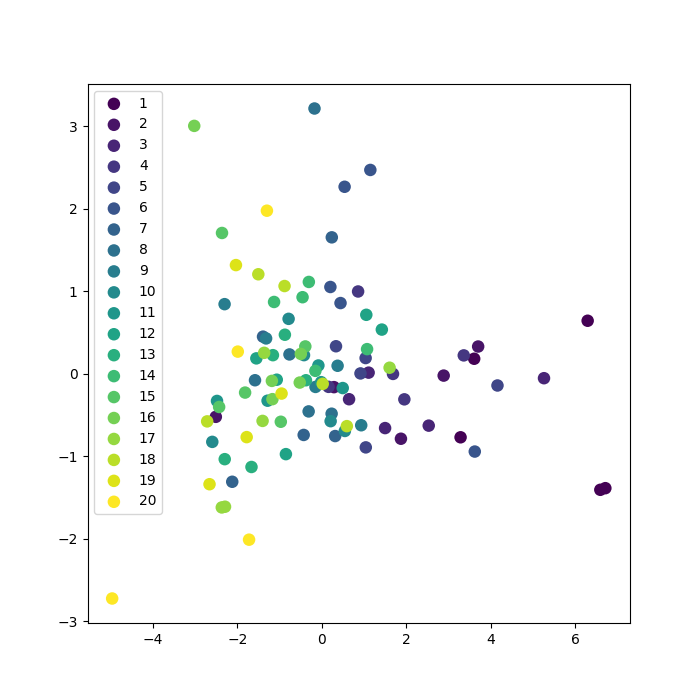

In [18]:
df = pd.DataFrame({"x":data[:, 0].flatten(), 
                   "y":data[:, 1].flatten(), 
                   "colors":np.array(df_all['league_position'].to_list()).flatten()})
size=81
cmap = plt.cm.viridis
norm = plt.Normalize(df['colors'].values.min(), df['colors'].values.max())

# labels = ['bottom half', 'top half']
plt.figure(figsize=(7,7))
for i, dff in df.groupby("colors"):
    plt.scatter(dff['x'], dff['y'], s=size, c=cmap(norm(dff['colors'])), 
                edgecolors='none', label=i)

plt.legend()
plt.show()

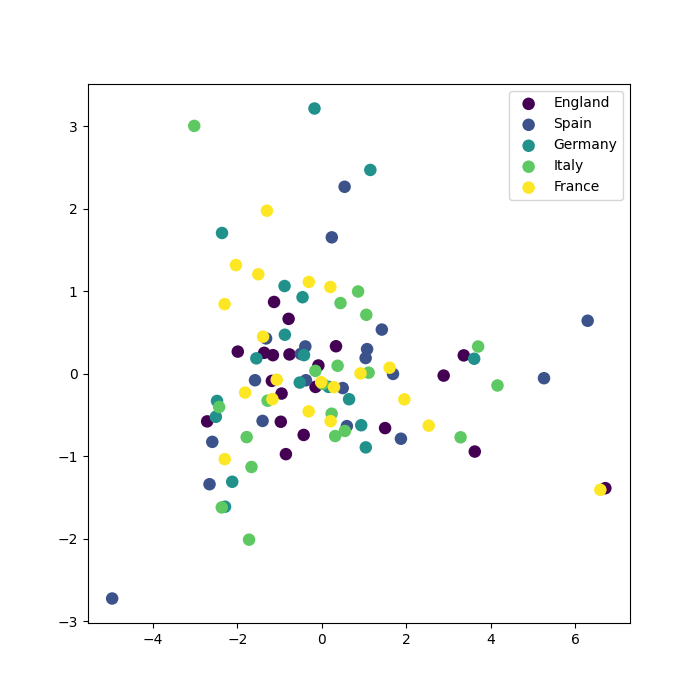

In [19]:
df = pd.DataFrame({"x":data[:, 0].flatten(), 
                   "y":data[:, 1].flatten(), 
                   "colors":np.array(df_all['league'].to_list()).flatten()})
size=81
cmap = plt.cm.viridis
norm = plt.Normalize(df['colors'].values.min(), df['colors'].values.max())
labels = ['England', 'Spain', 'Germany', 'Italy', 'France']

plt.figure(figsize=(7,7))
for i, dff in df.groupby("colors"):
    plt.scatter(dff['x'], dff['y'], s=size, c=cmap(norm(dff['colors'])), 
                edgecolors='none', label=labels[i])

plt.legend()
plt.show()

# t-SNE

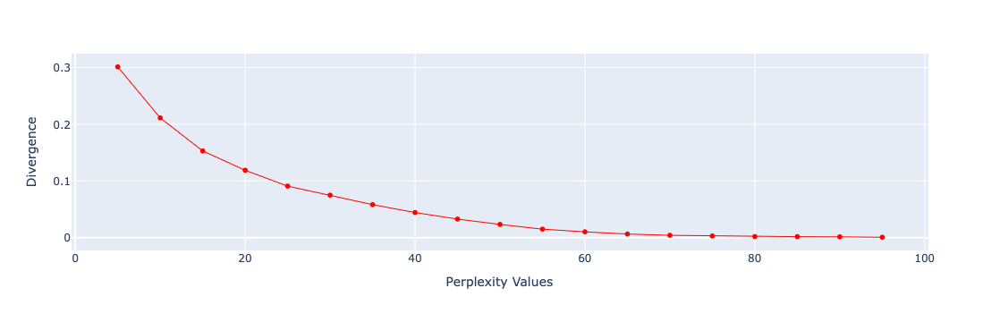

In [20]:
perplexity = np.arange(5, 100, 5)
divergence = []

for i in perplexity:
    model = TSNE(n_components=2, init="pca", perplexity=i)
    reduced = model.fit_transform(features_max)
    divergence.append(model.kl_divergence_)
fig = px.line(x=perplexity, y=divergence, markers=True)
fig.update_layout(xaxis_title="Perplexity Values", yaxis_title="Divergence")
fig.update_traces(line_color="red", line_width=1)
fig.show()

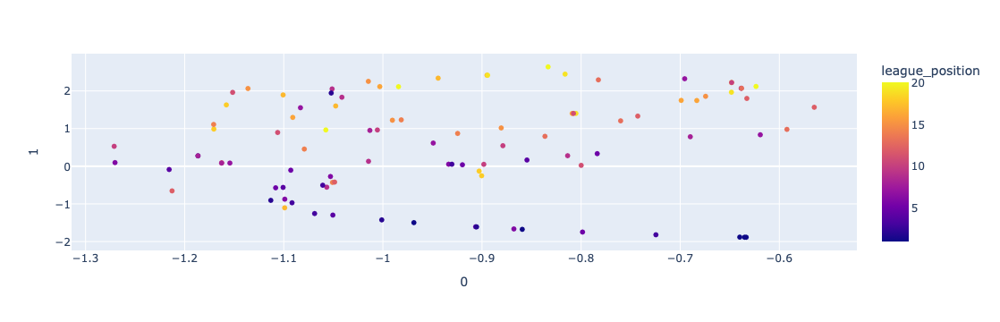

In [21]:
tsne = TSNE(n_components=2, random_state=0, perplexity=70)
projections = tsne.fit_transform(features_max)

fig = px.scatter(
    projections, x=0, y=1,
    color=df_all.league_position, labels={'color': 'league_position'}
)
fig.show()

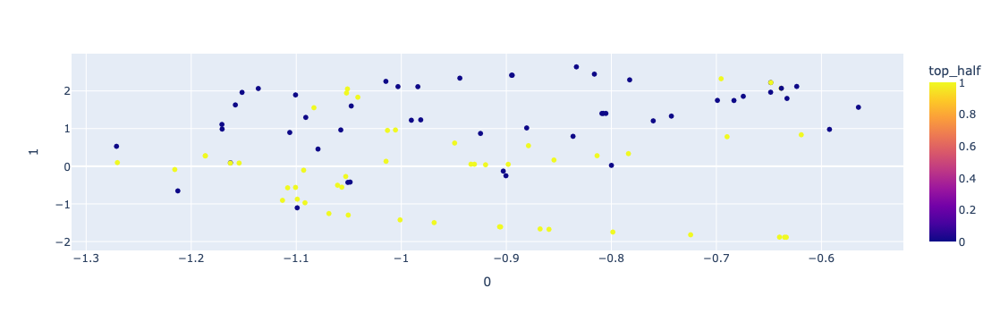

In [22]:
tsne = TSNE(n_components=2, random_state=0, perplexity=70)
projections = tsne.fit_transform(features_max)

fig = px.scatter(
    projections, x=0, y=1,
    color=df_all.top_half, labels={'color': 'top_half'}
    , color_discrete_sequence=['green', 'steelblue']
)

fig.show()

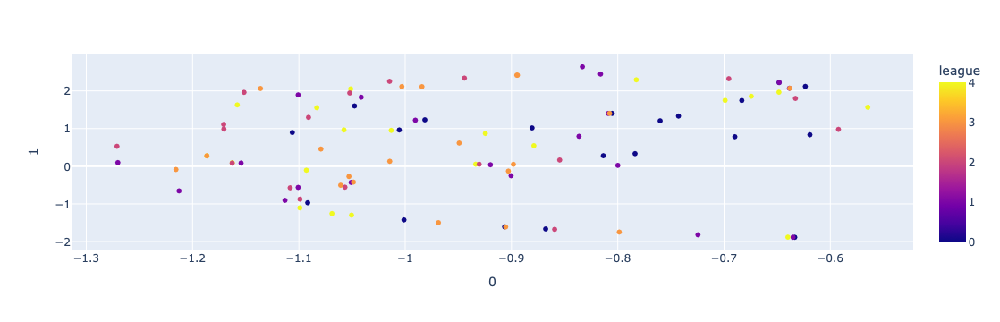

In [23]:
tsne = TSNE(n_components=2, random_state=0, perplexity=70)
projections = tsne.fit_transform(features_max)

fig = px.scatter(
    projections, x=0, y=1,
    color=df_all.league, labels={'color': 'league'}
)
fig.show()

# UMAP

In [24]:
trust_max = 0
for n in (2, 5, 10, 20, 30, 40, 50, 60, 70, 80):
    for m in (0.0, 0.1, 0.25, 0.5, 0.8, 0.99):
        umap_2d = UMAP(n_components=2, init='random', n_neighbors=n, min_dist=m, random_state=10)
        umap_res = umap_2d.fit_transform(features_max)
        trust = trustworthiness(features_max, umap_res)
        if trust > trust_max:
            trust_max = trust
            n_neighbours_ideal = n
            min_dist_ideal = m
            
print(f"The highest trustworty value is {trust_max}, with hyperparameters n_neighbours={n_neighbours_ideal} and min_dist={min_dist_ideal}")

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


The highest trustworty value is 0.9892517006802721, with hyperparameters n_neighbours=10 and min_dist=0.8


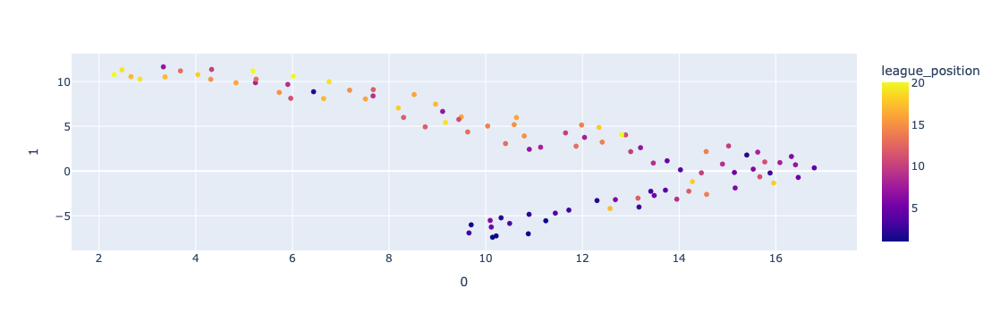

In [25]:
umap_2d = UMAP(n_components=2, init='random', n_neighbors=10, min_dist=0.8,  random_state=10)

proj_2d = umap_2d.fit_transform(features_max)

fig_2d = px.scatter(
    proj_2d, x=0, y=1,
    color=df_all.league_position, labels={'color': 'league_position'}
)

fig_2d.show()


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


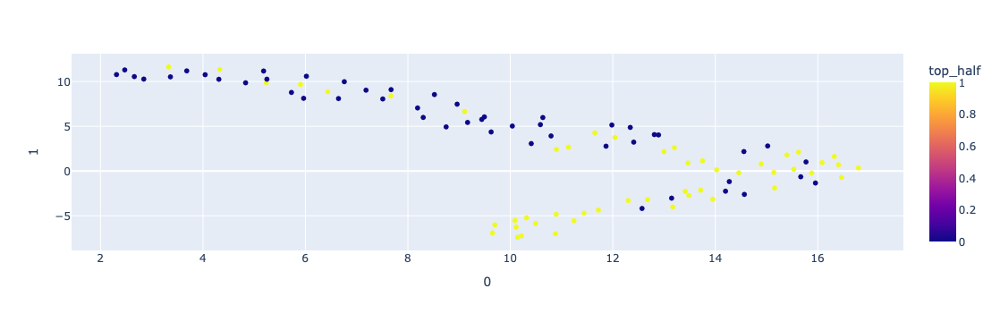

In [11]:
umap_2d = UMAP(n_components=2, init='random', n_neighbors=10, min_dist=0.8,  random_state=10)

proj_2d = umap_2d.fit_transform(features_max)

fig_2d = px.scatter(
    proj_2d, x=0, y=1,
    color=df_all.top_half, labels={'color': 'top_half'}
)

fig_2d.show()


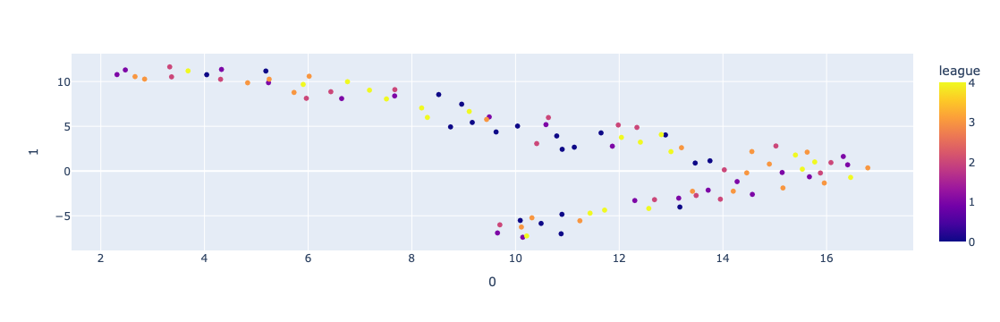

In [27]:
umap_2d = UMAP(n_components=2, init='random', n_neighbors=10, min_dist=0.8,  random_state=10)

proj_2d = umap_2d.fit_transform(features_max)

fig_2d = px.scatter(
    proj_2d, x=0, y=1,
    color=df_all.league, labels={'color': 'league'}
)

fig_2d.show()


# Compare DR methods

In [28]:
umap_trust = trustworthiness(features_max, proj_2d)
tsne_trust = trustworthiness(features_max, projections)
pca_trust = trustworthiness(features_max_norm, pca_2_result)

print(f"Trustworthiness of PCA: {pca_trust}")
print(f"Trustworthiness of t-SNE: {tsne_trust}")
print(f"Trustworthiness of UMAP: {umap_trust}")

Trustworthiness of PCA: 0.9169387755102041
Trustworthiness of t-SNE: 0.9894104308390023
Trustworthiness of UMAP: 0.9892517006802721


# DR for Average Centrality Values

In [29]:
features_avg = df_all[['avg_total_degree', 'med_in_degree', 'med_out_degree', 'avg_clustering_coef', 'avg_betweenness', 'avg_pagerank', 'max_clique']]
features_avg_norm = (features_max-features_max.mean())/features_max.std()


# PCA

In [30]:
pca_2 = PCA(n_components=2)
pca_2_result = pca_2.fit_transform(features_avg_norm)
print('Explained variation per principal component: {}'.format(pca_2.explained_variance_ratio_))

print('Cumulative variance explained by 2 principal components: {:.2%}'.format(np.sum(pca_2.explained_variance_ratio_)))



Explained variation per principal component: [0.64149306 0.13533769]
Cumulative variance explained by 2 principal components: 77.68%


In [31]:
dataset_pca = pd.DataFrame(abs(pca_2.components_), columns=features_avg_norm.columns, index=['PC_1', 'PC_2'])
print('\n\n', dataset_pca)



       max_total_degree  max_in_degree  max_out_degree  max_clustering_coef  \
PC_1          0.461325       0.454505        0.452548             0.186153   
PC_2          0.010934       0.030012        0.012353             0.746869   

      max_betweenness  max_pagerank  max_clique  
PC_1         0.207023      0.334295    0.431903  
PC_2         0.658299      0.075143    0.044837  


In [32]:
print("\n*************** Most important features *************************")
print('As per PC 1:\n', (dataset_pca[dataset_pca > 0.3].iloc[0]).dropna())   
print('\n\nAs per PC 2:\n', (dataset_pca[dataset_pca > 0.3].iloc[1]).dropna())
print("\n******************************************************************")


*************** Most important features *************************
As per PC 1:
 max_total_degree    0.461325
max_in_degree       0.454505
max_out_degree      0.452548
max_pagerank        0.334295
max_clique          0.431903
Name: PC_1, dtype: float64


As per PC 2:
 max_clustering_coef    0.746869
max_betweenness        0.658299
Name: PC_2, dtype: float64

******************************************************************


In [33]:
pca = PCA(2)
data = pca.fit_transform(features_avg_norm)

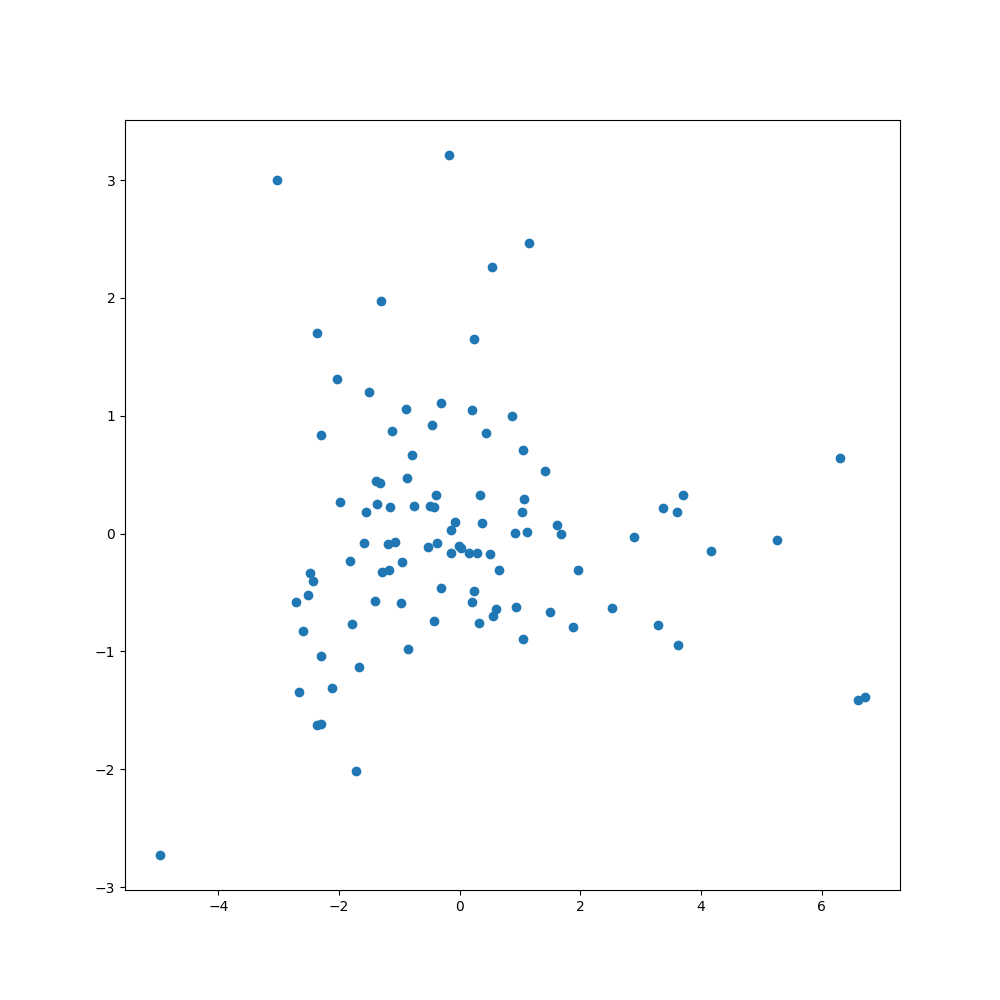

In [34]:
%matplotlib widget
team_names = df_all['team_name'].to_list()
x = data[:,0]
y = data[:,1]
size=81
cmap = plt.cm.viridis
plt.figure(figsize=(10,10))

plt.scatter(x, y)

# # Loop for annotation of all points 
# for i in range(len(team_names)): 
#     plt.annotate(team_names[i], (x[i], y[i] + 0.01), size=24) 
mplcursors.cursor(multiple = True).connect(
    "add", lambda sel: sel.annotation.set_text(
          team_names[sel.target.index]
))
plt.show()

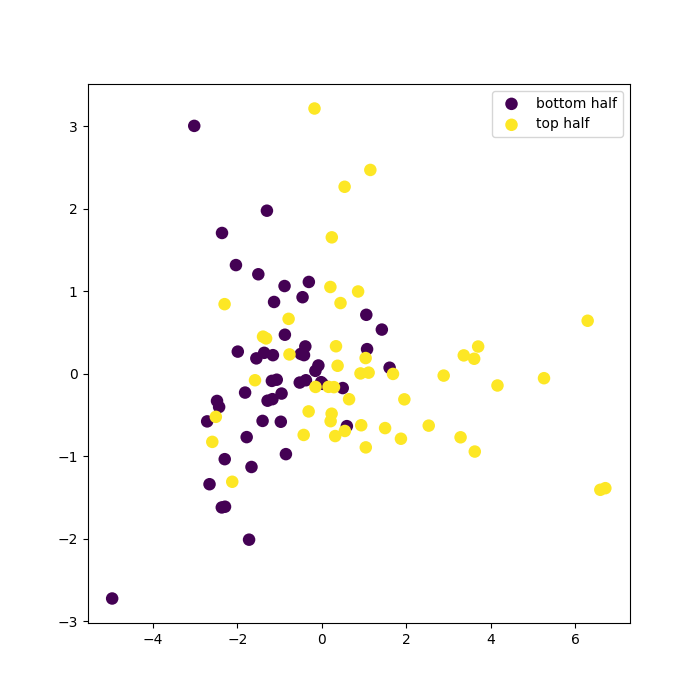

In [35]:
df = pd.DataFrame({"x":data[:, 0].flatten(), 
                   "y":data[:, 1].flatten(), 
                   "colors":np.array(df_all['top_half'].to_list()).flatten()})
size=81
cmap = plt.cm.viridis
norm = plt.Normalize(df['colors'].values.min(), df['colors'].values.max())

labels = ['bottom half', 'top half']

plt.figure(figsize=(7,7))
for i, dff in df.groupby("colors"):
    plt.scatter(dff['x'], dff['y'], s=size, c=cmap(norm(dff['colors'])), 
                edgecolors='none', label=labels[i])

plt.legend()
plt.show()

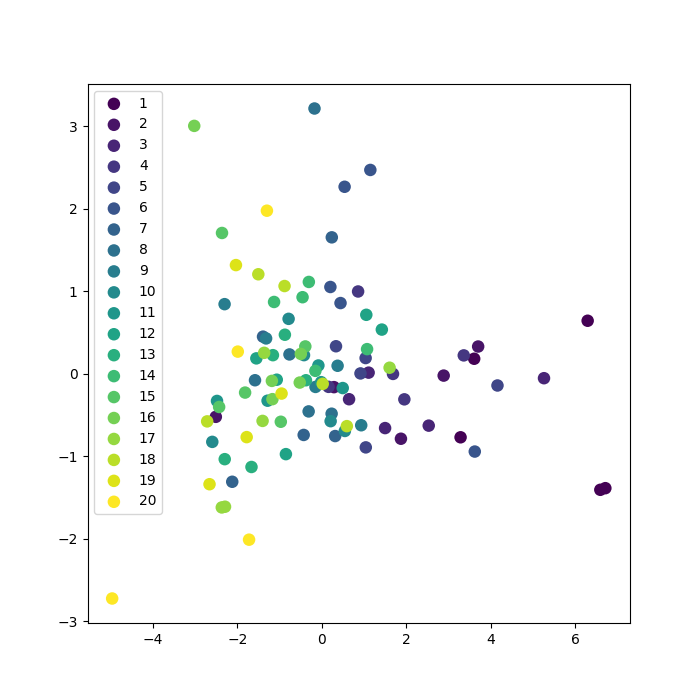

In [36]:
df = pd.DataFrame({"x":data[:, 0].flatten(), 
                   "y":data[:, 1].flatten(), 
                   "colors":np.array(df_all['league_position'].to_list()).flatten()})
size=81
cmap = plt.cm.viridis
norm = plt.Normalize(df['colors'].values.min(), df['colors'].values.max())

# labels = ['bottom half', 'top half']
plt.figure(figsize=(7,7))
for i, dff in df.groupby("colors"):
    plt.scatter(dff['x'], dff['y'], s=size, c=cmap(norm(dff['colors'])), 
                edgecolors='none', label=i)

plt.legend()
plt.show()

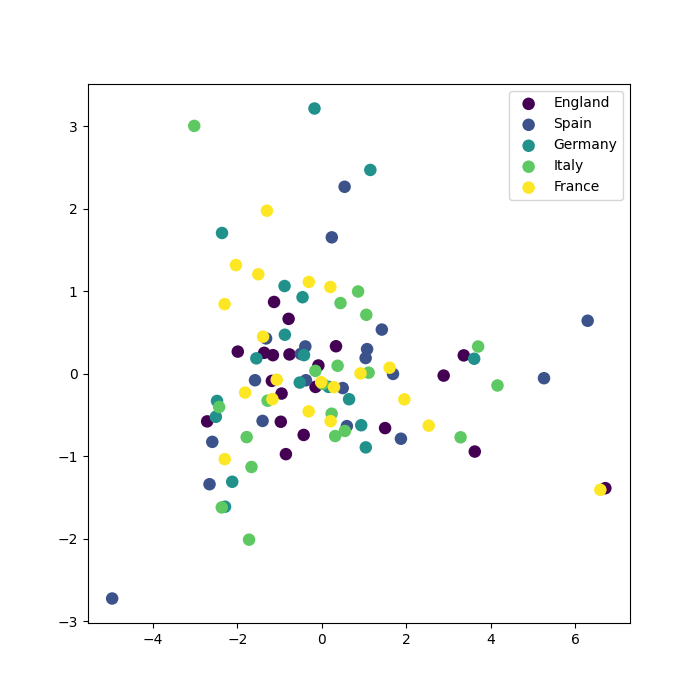

In [37]:
df = pd.DataFrame({"x":data[:, 0].flatten(), 
                   "y":data[:, 1].flatten(), 
                   "colors":np.array(df_all['league'].to_list()).flatten()})
size=81
cmap = plt.cm.viridis
norm = plt.Normalize(df['colors'].values.min(), df['colors'].values.max())
labels = ['England', 'Spain', 'Germany', 'Italy', 'France']

plt.figure(figsize=(7,7))
for i, dff in df.groupby("colors"):
    plt.scatter(dff['x'], dff['y'], s=size, c=cmap(norm(dff['colors'])), 
                edgecolors='none', label=labels[i])

plt.legend()
plt.show()

# t-SNE

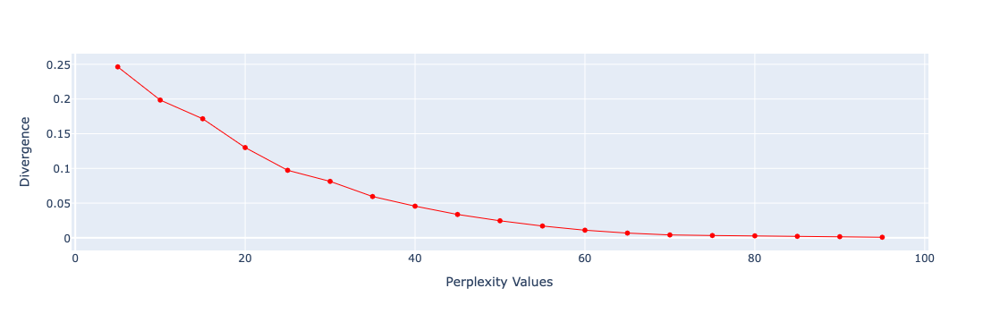

In [38]:
perplexity = np.arange(5, 100, 5)
divergence = []

for i in perplexity:
    model = TSNE(n_components=2, init="pca", perplexity=i)
    reduced = model.fit_transform(features_avg)
    divergence.append(model.kl_divergence_)
fig = px.line(x=perplexity, y=divergence, markers=True)
fig.update_layout(xaxis_title="Perplexity Values", yaxis_title="Divergence")
fig.update_traces(line_color="red", line_width=1)
fig.show()

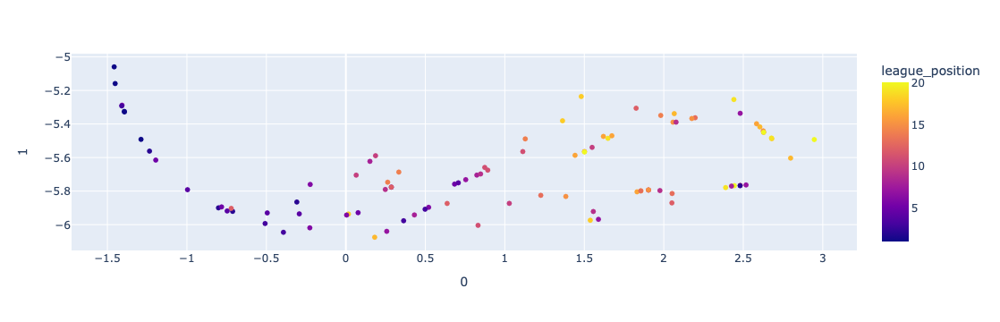

In [39]:
tsne = TSNE(n_components=2, random_state=0, perplexity=70)
projections = tsne.fit_transform(features_avg)

fig = px.scatter(
    projections, x=0, y=1,
    color=df_all.league_position, labels={'color': 'league_position'}
)
fig.show()

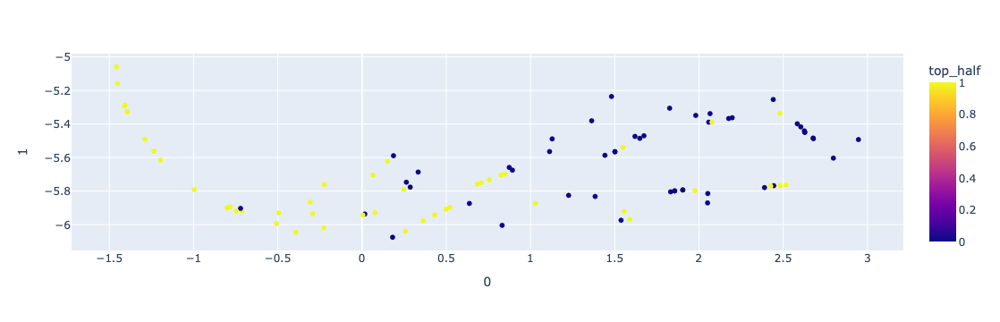

In [40]:
tsne = TSNE(n_components=2, random_state=0, perplexity=70)
projections = tsne.fit_transform(features_avg)

fig = px.scatter(
    projections, x=0, y=1,
    color=df_all.top_half, labels={'color': 'top_half'}
)
fig.show()

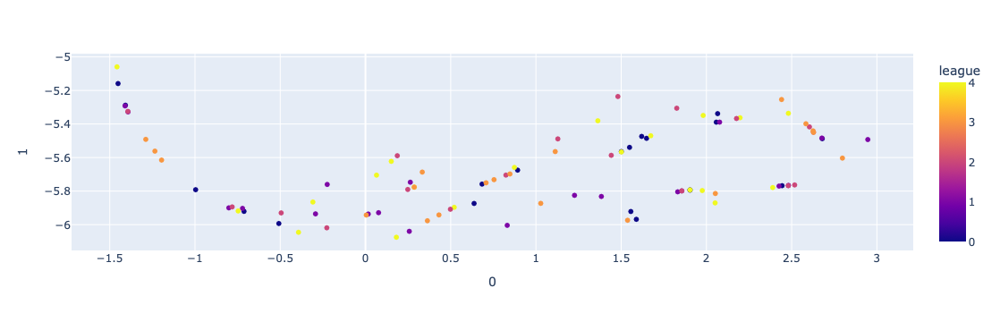

In [41]:
tsne = TSNE(n_components=2, random_state=0, perplexity=70)
projections = tsne.fit_transform(features_avg)

fig = px.scatter(
    projections, x=0, y=1,
    color=df_all.league, labels={'color': 'league'}
)
fig.show()

# UMAP

In [42]:
trust_max = 0
for n in (2, 5, 10, 20, 30, 40, 50, 60, 70, 80):
    for m in (0.0, 0.1, 0.25, 0.5, 0.8, 0.99):
        umap_2d = UMAP(n_components=2, init='random', n_neighbors=n, min_dist=m, random_state=10)
        umap_res = umap_2d.fit_transform(features_avg)
        trust = trustworthiness(features_avg, umap_res)
        if trust > trust_max:
            trust_max = trust
            n_neighbours_ideal = n
            min_dist_ideal = m
            
print(f"The highest trustworty value is {trust_max}, with hyperparameters n_neighbours={n_neighbours_ideal} and min_dist={min_dist_ideal}")

The highest trustworty value is 0.9840589569160998, with hyperparameters n_neighbours=5 and min_dist=0.5


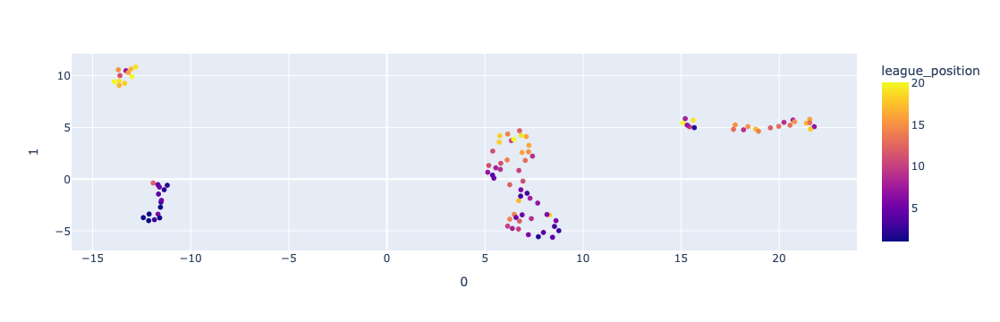

In [43]:
umap_2d = UMAP(n_components=2, init='random', n_neighbors=5, min_dist=0.5,  random_state=10)

proj_2d = umap_2d.fit_transform(features_avg)

fig_2d = px.scatter(
    proj_2d, x=0, y=1,
    color=df_all.league_position, labels={'color': 'league_position'}
)

fig_2d.show()


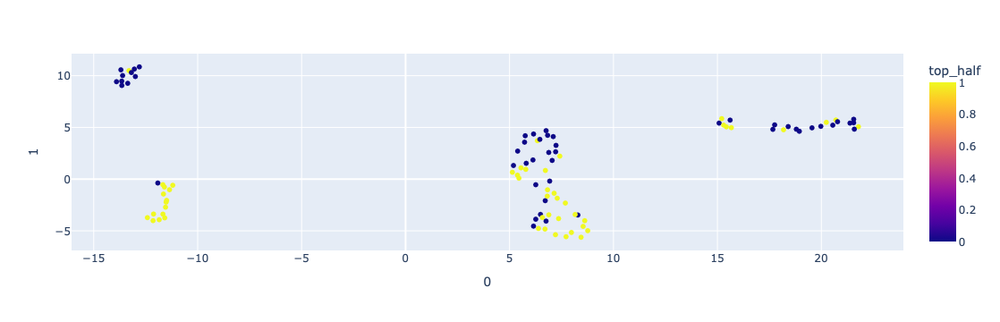

In [44]:
umap_2d = UMAP(n_components=2, init='random', n_neighbors=5, min_dist=0.5,  random_state=10)

proj_2d = umap_2d.fit_transform(features_avg)

fig_2d = px.scatter(
    proj_2d, x=0, y=1,
    color=df_all.top_half, labels={'color': 'top_half'}
)

fig_2d.show()


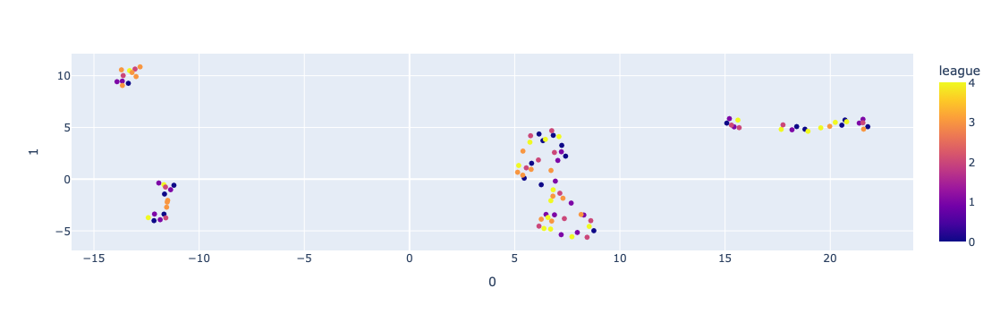

In [45]:
umap_2d = UMAP(n_components=2, init='random', n_neighbors=5, min_dist=0.5,  random_state=10)

proj_2d = umap_2d.fit_transform(features_avg)

fig_2d = px.scatter(
    proj_2d, x=0, y=1,
    color=df_all.league, labels={'color': 'league'}
)

fig_2d.show()


# Compare DR Methods

In [46]:
umap_trust = trustworthiness(features_avg, proj_2d)
tsne_trust = trustworthiness(features_avg, projections)
pca_trust = trustworthiness(features_avg_norm, pca_2_result)

print(f"Trustworthiness of PCA: {pca_trust}")
print(f"Trustworthiness of t-SNE: {tsne_trust}")
print(f"Trustworthiness of UMAP: {umap_trust}")

Trustworthiness of PCA: 0.9169387755102041
Trustworthiness of t-SNE: 0.9865986394557823
Trustworthiness of UMAP: 0.9840589569160998


# Avg. and max values

In [14]:
features = df_all[['avg_total_degree', 'med_in_degree', 'med_out_degree', 'avg_clustering_coef', 'avg_betweenness', 'avg_pagerank', 'max_clique', 'max_total_degree', 'max_in_degree', 'max_out_degree', 'max_clustering_coef', 'max_betweenness', 'max_pagerank']]
features_norm=(features-features.mean())/features.std()


In [48]:
pca_2 = PCA(n_components=2)
pca_2_result = pca_2.fit_transform(features_norm)
print('Explained variation per principal component: {}'.format(pca_2.explained_variance_ratio_))

print('Cumulative variance explained by 2 principal components: {:.2%}'.format(np.sum(pca_2.explained_variance_ratio_)))



Explained variation per principal component: [0.58895743 0.14632695]
Cumulative variance explained by 2 principal components: 73.53%


In [49]:
dataset_pca = pd.DataFrame(abs(pca_2.components_), columns=features_norm.columns, index=['PC_1', 'PC_2'])
print('\n\n', dataset_pca)



       avg_total_degree  med_in_degree  med_out_degree  avg_clustering_coef  \
PC_1          0.351559       0.335647        0.346605             0.064668   
PC_2          0.054510       0.043317        0.066202             0.596758   

      avg_betweenness  avg_pagerank  max_clique  max_total_degree  \
PC_1         0.204238      0.145676    0.330893          0.350403   
PC_2         0.422185      0.202634    0.040822          0.040052   

      max_in_degree  max_out_degree  max_clustering_coef  max_betweenness  \
PC_1       0.342684         0.34577             0.137031         0.147514   
PC_2       0.066382         0.03519             0.466791         0.392349   

      max_pagerank  
PC_1      0.258257  
PC_2      0.186016  


In [50]:
print("\n*************** Most important features *************************")
print('As per PC 1:\n', (dataset_pca[dataset_pca > 0.3].iloc[0]).dropna())   
print('\n\nAs per PC 2:\n', (dataset_pca[dataset_pca > 0.3].iloc[1]).dropna())
print("\n******************************************************************")


*************** Most important features *************************
As per PC 1:
 avg_total_degree    0.351559
med_in_degree       0.335647
med_out_degree      0.346605
max_clique          0.330893
max_total_degree    0.350403
max_in_degree       0.342684
max_out_degree      0.345770
Name: PC_1, dtype: float64


As per PC 2:
 avg_clustering_coef    0.596758
avg_betweenness        0.422185
max_clustering_coef    0.466791
max_betweenness        0.392349
Name: PC_2, dtype: float64

******************************************************************


In [82]:
pca = PCA(2)
data = pca.fit_transform(features_norm)

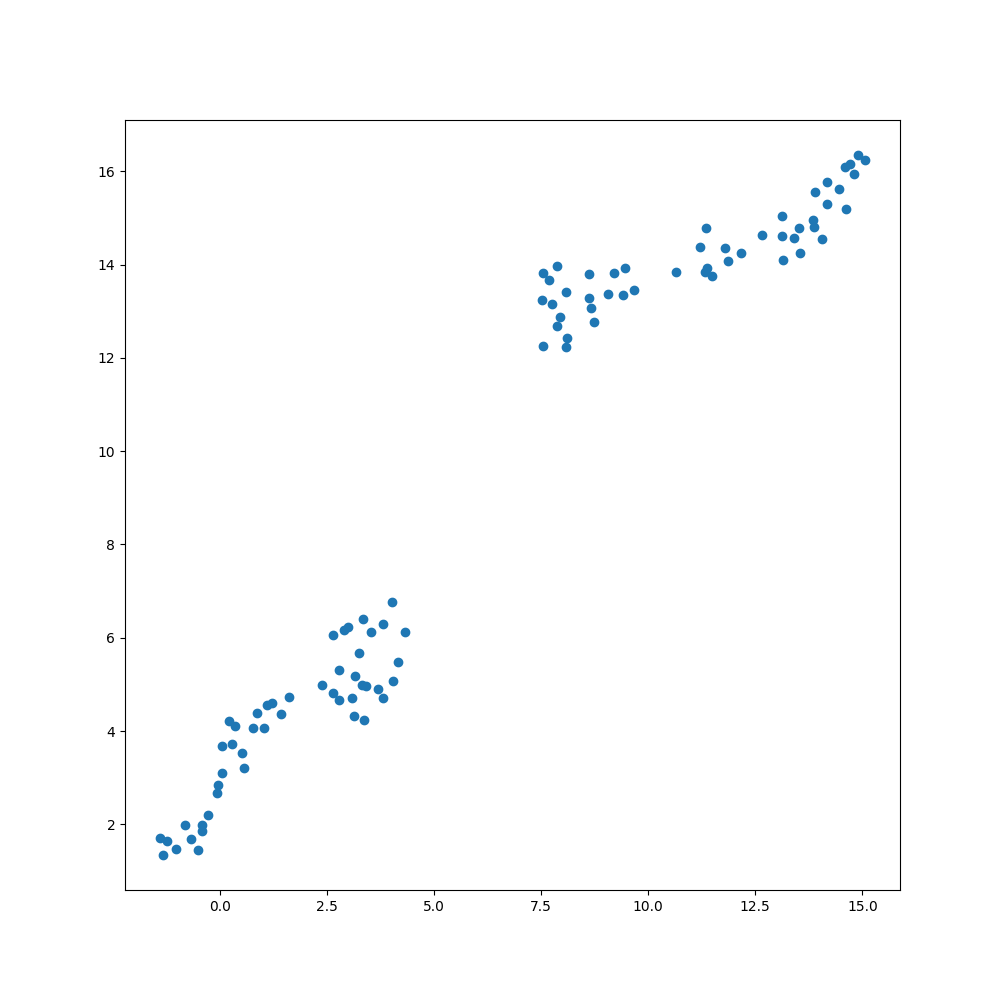

In [80]:
%matplotlib widget
team_names = df_all['team_name'].to_list()
x = data[:,0]
y = data[:,1]
size=81
cmap = plt.cm.viridis
plt.figure(figsize=(10,10))

plt.scatter(x, y)

# # Loop for annotation of all points 
# for i in range(len(team_names)): 
#     plt.annotate(team_names[i], (x[i], y[i] + 0.01), size=24) 
mplcursors.cursor(multiple = True).connect(
    "add", lambda sel: sel.annotation.set_text(
          team_names[sel.target.index]
))
plt.show()

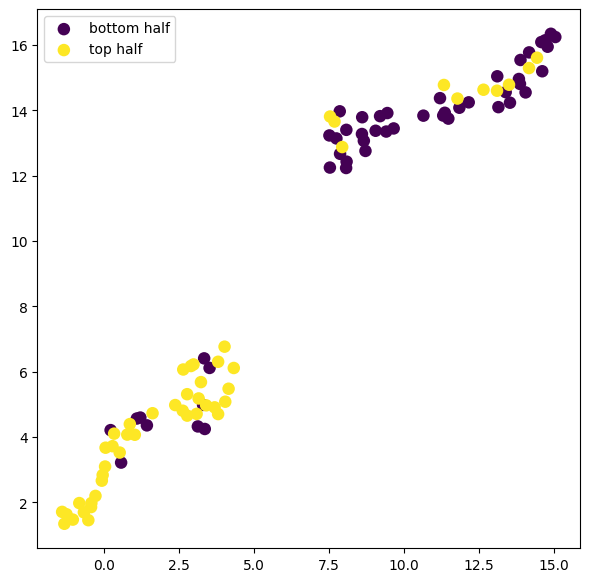

In [79]:
df = pd.DataFrame({"x":data[:, 0].flatten(), 
                   "y":data[:, 1].flatten(), 
                   "colors":np.array(df_all['top_half'].to_list()).flatten()})
size=81
cmap = plt.cm.viridis
norm = plt.Normalize(df['colors'].values.min(), df['colors'].values.max())

labels = ['bottom half', 'top half']

plt.figure(figsize=(7,7))
for i, dff in df.groupby("colors"):
    plt.scatter(dff['x'], dff['y'], s=size, c=cmap(norm(dff['colors'])), 
                edgecolors='none', label=labels[i])

plt.legend()
plt.show()

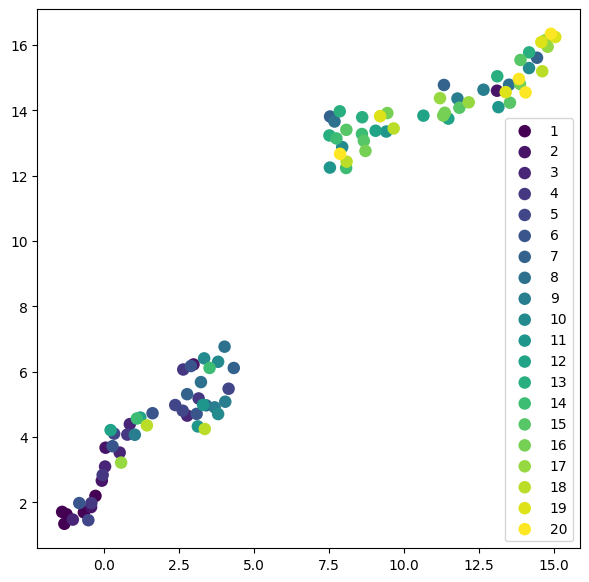

In [78]:
df = pd.DataFrame({"x":data[:, 0].flatten(), 
                   "y":data[:, 1].flatten(), 
                   "colors":np.array(df_all['league_position'].to_list()).flatten()})
size=81
cmap = plt.cm.viridis
norm = plt.Normalize(df['colors'].values.min(), df['colors'].values.max())

# labels = ['bottom half', 'top half']
plt.figure(figsize=(7,7))
for i, dff in df.groupby("colors"):
    plt.scatter(dff['x'], dff['y'], s=size, c=cmap(norm(dff['colors'])), 
                edgecolors='none', label=i)

plt.legend()
plt.show()

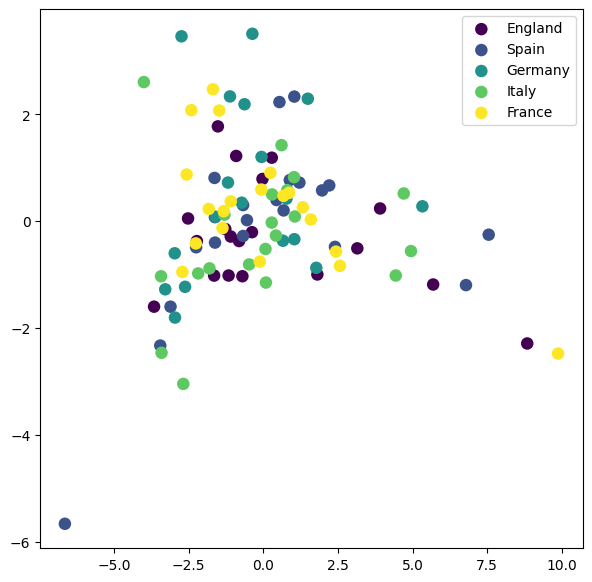

In [94]:
df = pd.DataFrame({"x":data[:, 0].flatten(), 
                   "y":data[:, 1].flatten(), 
                   "colors":np.array(df_all['league'].to_list()).flatten()})
size=81
cmap = plt.cm.viridis
norm = plt.Normalize(df['colors'].values.min(), df['colors'].values.max())
labels = ['England', 'Spain', 'Germany', 'Italy', 'France']

plt.figure(figsize=(7,7))
for i, dff in df.groupby("colors"):
    plt.scatter(dff['x'], dff['y'], s=size, c=cmap(norm(dff['colors'])), 
                edgecolors='none', label=labels[i])

plt.legend()
plt.show()

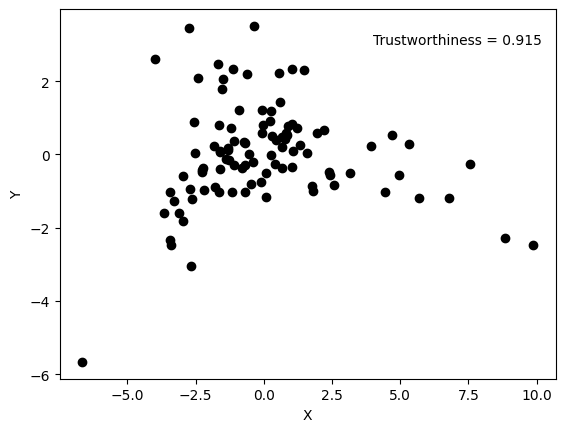

In [93]:
# Creating figure
fig = plt.figure()
 
# Adding axes on the figure
ax = fig.add_subplot(111)

ax.scatter(data[:,0], data[:,1], color='k')
plt.xlabel("X")
plt.ylabel("Y")

# Adding text without box on the plot.
ax.text(4, 3, 'Trustworthiness = 0.915')

fig.savefig('../images/pca_players.png')

# t-SNE

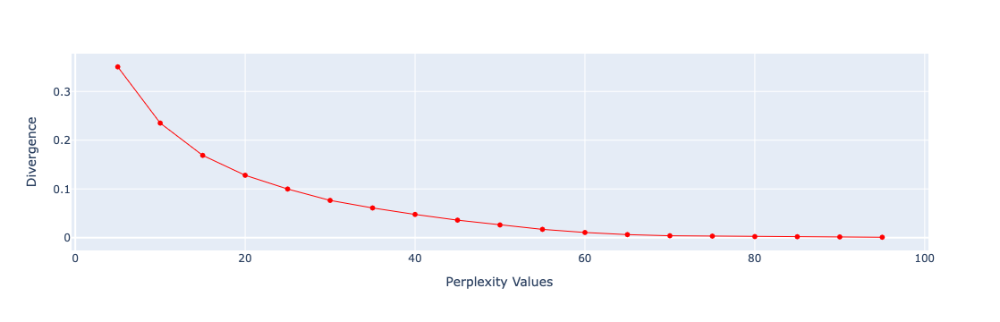

In [56]:
perplexity = np.arange(5, 100, 5)
divergence = []

for i in perplexity:
    model = TSNE(n_components=2, init="pca", perplexity=i)
    reduced = model.fit_transform(features)
    divergence.append(model.kl_divergence_)
fig = px.line(x=perplexity, y=divergence, markers=True)
fig.update_layout(xaxis_title="Perplexity Values", yaxis_title="Divergence")
fig.update_traces(line_color="red", line_width=1)
fig.show()

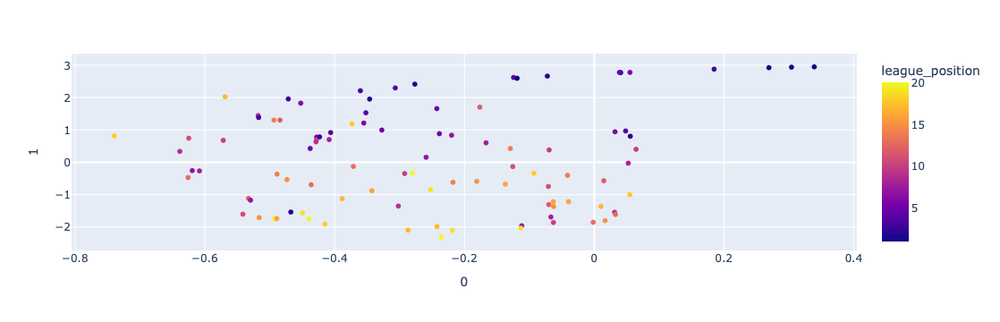

In [57]:
tsne = TSNE(n_components=2, random_state=0, perplexity=65)
projections = tsne.fit_transform(features)

fig = px.scatter(
    projections, x=0, y=1,
    color=df_all.league_position, labels={'color': 'league_position'}
)
fig.show()

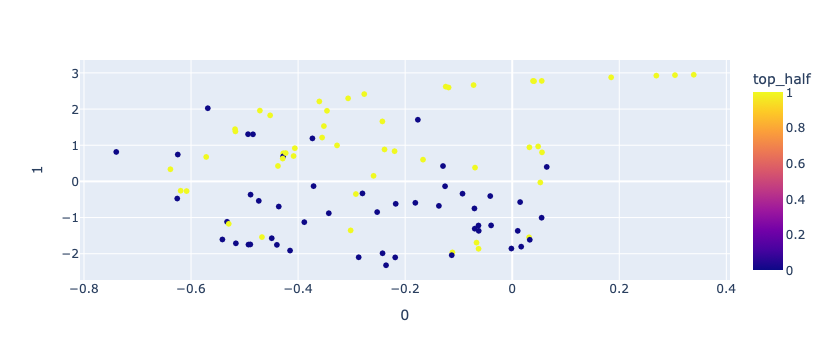

In [58]:
tsne = TSNE(n_components=2, random_state=0, perplexity=65)
projections = tsne.fit_transform(features)

fig = px.scatter(
    projections, x=0, y=1,
    color=df_all.top_half, labels={'color': 'top_half'}
)
fig.show()

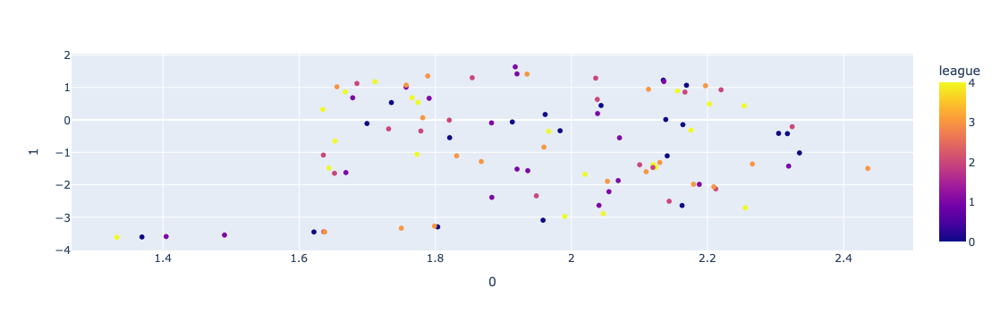

In [57]:
tsne = TSNE(n_components=2, random_state=0, perplexity=65)
projections = tsne.fit_transform(features)

fig = px.scatter(
    projections, x=0, y=1,
    color=df_all.league, labels={'color': 'league'}
)
fig.show()

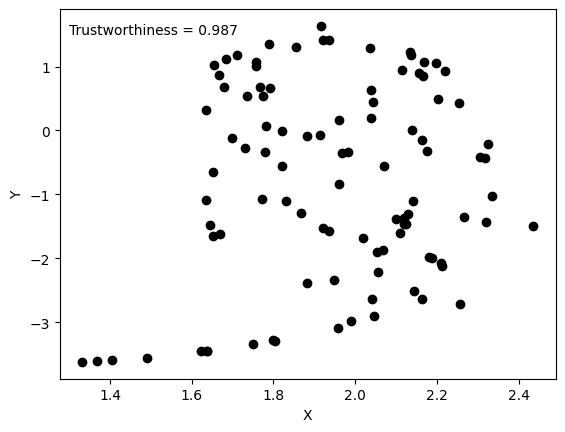

In [92]:
# Creating figure
fig = plt.figure()
 
# Adding axes on the figure
ax = fig.add_subplot(111)

ax.scatter(projections[:,0], projections[:,1], color='k')
plt.xlabel("X")
plt.ylabel("Y")

# Adding text without box on the plot.
ax.text(1.3, 1.5, 'Trustworthiness = 0.987')
fig.savefig('../images/tsne_players.png')

# UMAP

In [60]:
trust_max = 0
for n in (2, 5, 10, 20, 30, 40, 50, 60, 70, 80):
    for m in (0.0, 0.1, 0.25, 0.5, 0.8, 0.99):
        umap_2d = UMAP(n_components=2, init='random', n_neighbors=n, min_dist=m, random_state=10)
        umap_res = umap_2d.fit_transform(features)
        trust = trustworthiness(features, umap_res)
        if trust > trust_max:
            trust_max = trust
            n_neighbours_ideal = n
            min_dist_ideal = m
            
print(f"The highest trustworty value is {trust_max}, with hyperparameters n_neighbours={n_neighbours_ideal} and min_dist={min_dist_ideal}")

The highest trustworty value is 0.9866439909297052, with hyperparameters n_neighbours=10 and min_dist=0.25


In [13]:
umap_2d = UMAP(n_components=2, init='random', n_neighbors=10, min_dist=0.25,  random_state=10)

proj_2d = umap_2d.fit_transform(features)

fig_2d = px.scatter(
    proj_2d, x=0, y=1,
    color=df_all.league_position, labels={'color': 'league_position'}
)

fig_2d.show()


NameError: name 'features' is not defined

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


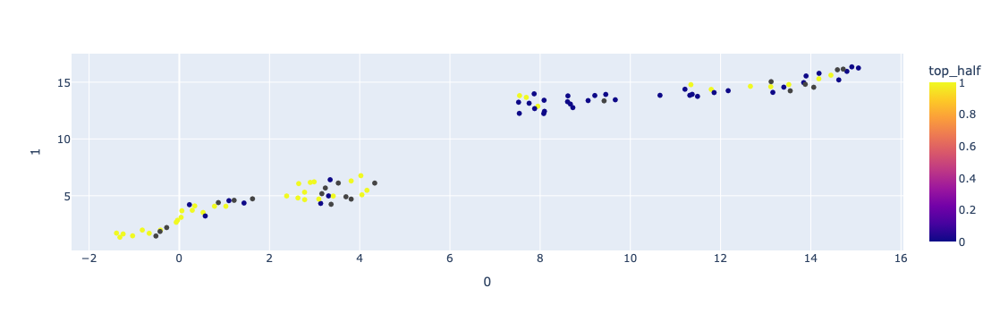

In [11]:
umap_2d = UMAP(n_components=2, init='random', n_neighbors=10, min_dist=0.25,  random_state=10)

proj_2d = umap_2d.fit_transform(features)

fig_2d = px.scatter(
    proj_2d, x=0, y=1,
    color=df_all.top_half, labels={'color': 'top_half'}
)

fig_2d.show()


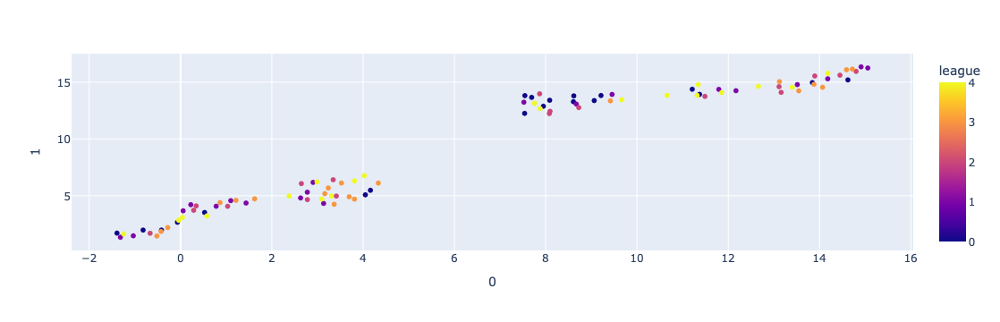

In [15]:
umap_2d = UMAP(n_components=2, init='random', n_neighbors=10, min_dist=0.25,  random_state=10)

proj_2d = umap_2d.fit_transform(features)

fig_2d = px.scatter(
    proj_2d, x=0, y=1,
    color=df_all.league, labels={'color': 'league'}
)

fig_2d.show()


## Charts

Output charts for report

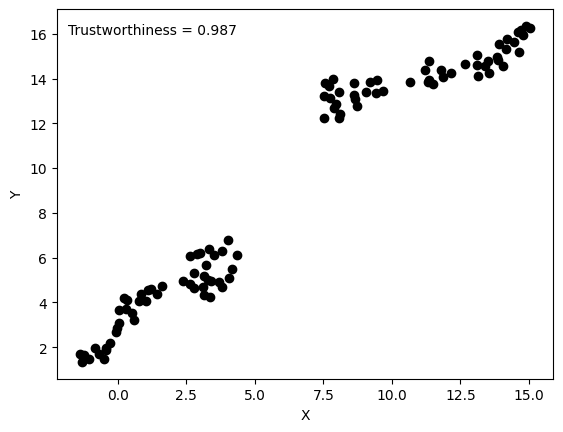

In [91]:
# Creating figure
fig = plt.figure()
 
# Adding axes on the figure
ax = fig.add_subplot(111)

ax.scatter(proj_2d[:,0], proj_2d[:,1], color='k')
plt.xlabel("X")
plt.ylabel("Y")

# Adding text without box on the plot.
ax.text(-1.8, 16, 'Trustworthiness = 0.987')
fig.savefig('../images/umap_players.png')

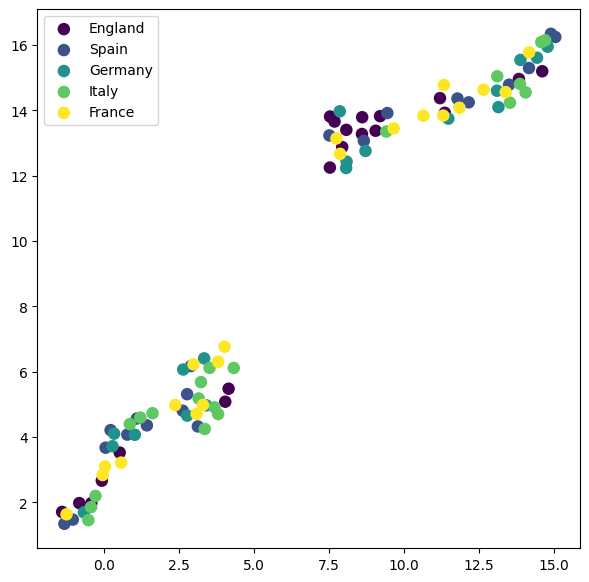

In [122]:
df = pd.DataFrame({"x":proj_2d[:, 0].flatten(), 
                   "y":proj_2d[:, 1].flatten(), 
                   "colors":np.array(df_all['league'].to_list()).flatten()})
size=81
cmap = plt.cm.viridis
norm = plt.Normalize(df['colors'].values.min(), df['colors'].values.max())
labels = ['England', 'Spain', 'Germany', 'Italy', 'France']

plt.figure(figsize=(7,7))
for i, dff in df.groupby("colors"):
    plt.scatter(dff['x'], dff['y'], s=size, c=cmap(norm(dff['colors'])), 
                edgecolors='none', label=labels[i])

plt.legend()
plt.savefig('../images/players_leagues.png')

In [111]:
list(range(21))

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]

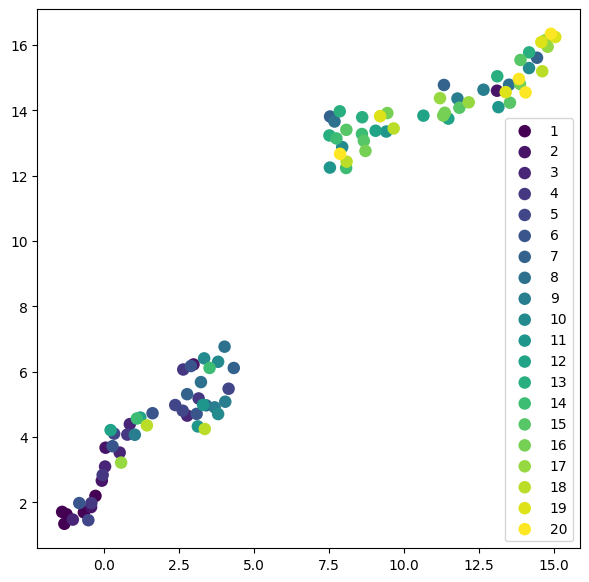

In [123]:
df = pd.DataFrame({"x":proj_2d[:, 0].flatten(), 
                   "y":proj_2d[:, 1].flatten(), 
                   "colors":np.array(df_all['league_position'].to_list()).flatten()})
size=81
cmap = plt.cm.viridis
norm = plt.Normalize(df['colors'].values.min(), df['colors'].values.max())
labels = list(range(21))

plt.figure(figsize=(7,7))
for i, dff in df.groupby("colors"):
    plt.scatter(dff['x'], dff['y'], s=size, c=cmap(norm(dff['colors'])), 
                edgecolors='none', label=labels[i])

plt.legend()
plt.savefig('../images/players_pos.png')

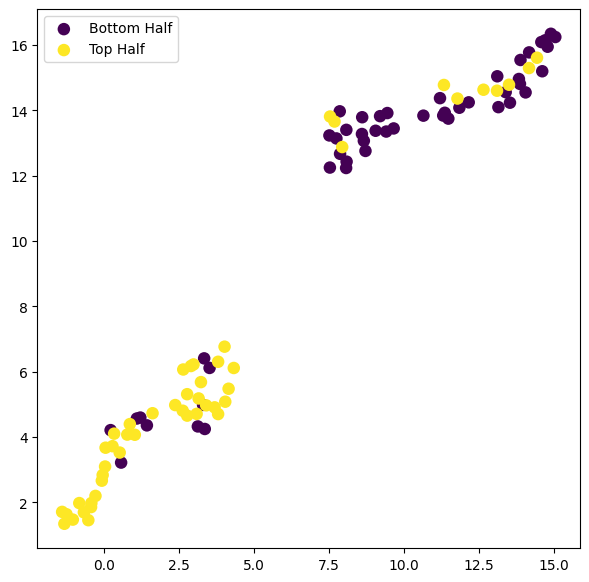

In [124]:
df = pd.DataFrame({"x":proj_2d[:, 0].flatten(), 
                   "y":proj_2d[:, 1].flatten(), 
                   "colors":np.array(df_all['top_half'].to_list()).flatten()})
size=81
cmap = plt.cm.viridis
norm = plt.Normalize(df['colors'].values.min(), df['colors'].values.max())
labels = ['Bottom Half', 'Top Half']

plt.figure(figsize=(7,7))
for i, dff in df.groupby("colors"):
    # print(dff)
    plt.scatter(dff['x'], dff['y'], s=size, c=cmap(norm(dff['colors'])), 
                edgecolors='none', label=labels[i])

plt.legend()
plt.savefig('../images/players_half.png')

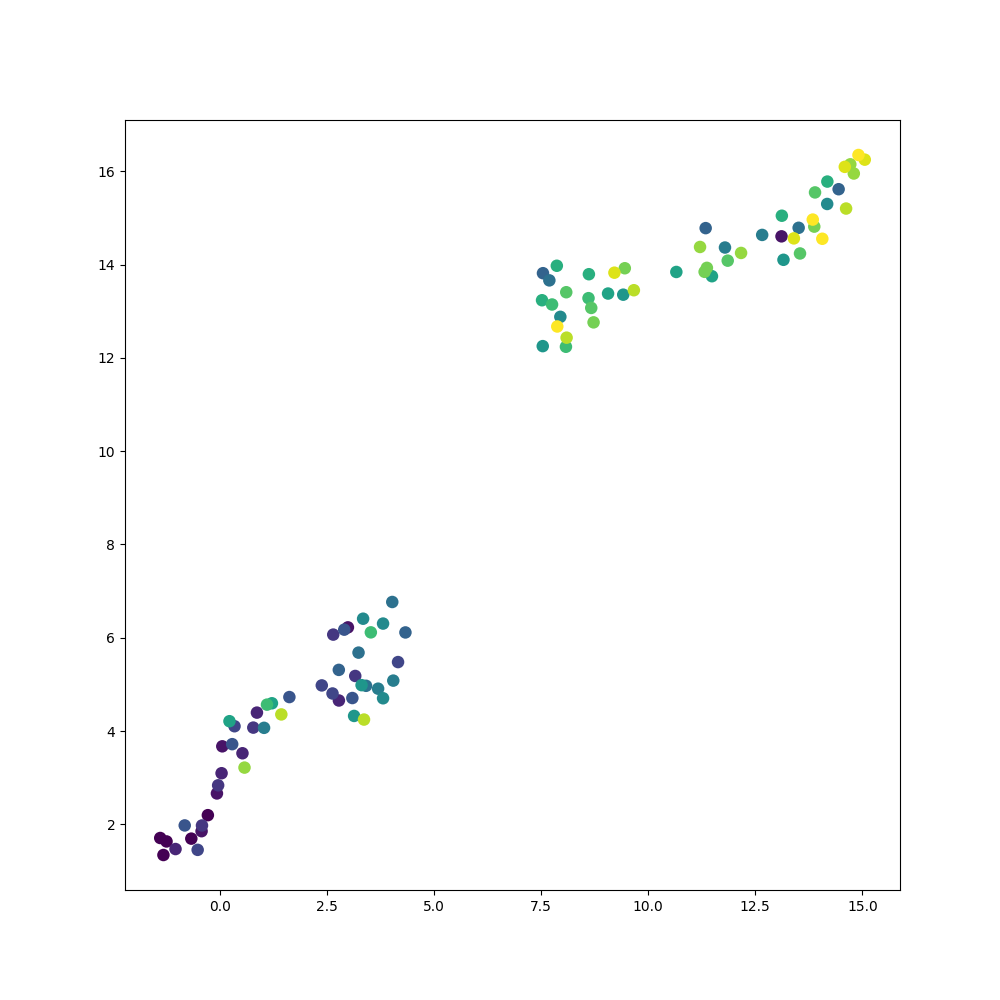

In [64]:
%matplotlib widget
team_names = df_all['team_name'].to_list()

df = pd.DataFrame({"x":proj_2d[:,0].flatten(), 
                   "y":proj_2d[:,1].flatten(), 
                   "colors":np.array(df_all['league_position'].to_list()).flatten()})
size=81
cmap = plt.cm.viridis
plt.figure(figsize=(10,10))

cmap = plt.cm.viridis
norm = plt.Normalize(df['colors'].values.min(), df['colors'].values.max())

# labels = ['bottom half', 'top half']
for i, dff in df.groupby("colors"):
    plt.scatter(dff['x'], dff['y'], s=size, c=cmap(norm(dff['colors'])), 
                edgecolors='none', label=i)

# # Loop for annotation of all points 
# for i in range(len(team_names)): 
#     plt.annotate(team_names[i], (x[i], y[i] + 0.01), size=24) 
mplcursors.cursor(multiple = True).connect(
    "add", lambda sel: sel.annotation.set_text(
          team_names[sel.target.index]
))
plt.show()

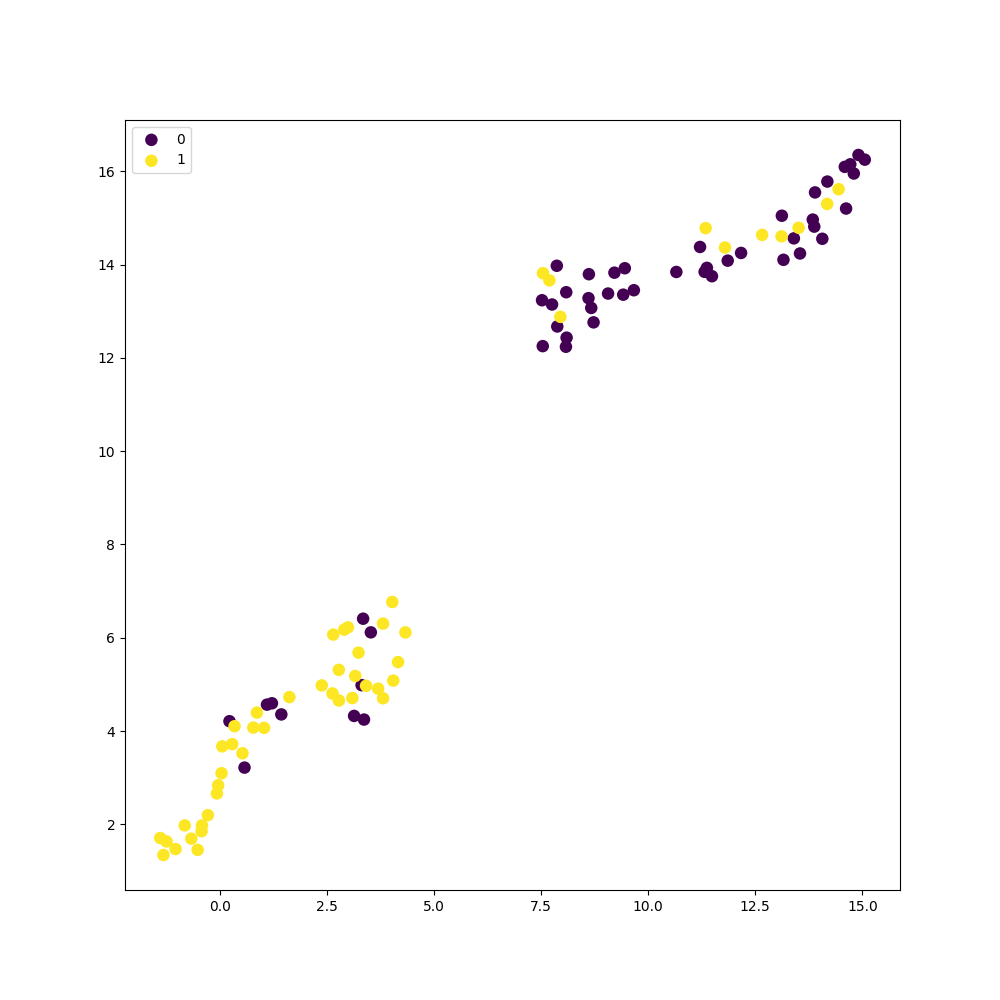

In [81]:
%matplotlib widget
team_names = df_all['team_name'].to_list()

df = pd.DataFrame({"x":proj_2d[:,0].flatten(), 
                   "y":proj_2d[:,1].flatten(), 
                   "colors":np.array(df_all['top_half'].to_list()).flatten()})
size=81
cmap = plt.cm.viridis
plt.figure(figsize=(10,10))

cmap = plt.cm.viridis
norm = plt.Normalize(df['colors'].values.min(), df['colors'].values.max())

# labels = ['bottom half', 'top half']
for i, dff in df.groupby("colors"):
    plt.scatter(dff['x'], dff['y'], s=size, c=cmap(norm(dff['colors'])), 
                edgecolors='none', label=i)

# # Loop for annotation of all points 
# for i in range(len(team_names)): 
#     plt.annotate(team_names[i], (x[i], y[i] + 0.01), size=24) 
mplcursors.cursor(multiple = True).connect(
    "add", lambda sel: sel.annotation.set_text(
          team_names[sel.target.index]
))

plt.legend()
plt.show()

In [66]:
umap_trust = trustworthiness(features, proj_2d)
tsne_trust = trustworthiness(features, projections)
pca_trust = trustworthiness(features_norm, pca_2_result)

print(f"Trustworthiness of PCA: {pca_trust}")
print(f"Trustworthiness of t-SNE: {tsne_trust}")
print(f"Trustworthiness of UMAP: {umap_trust}")

Trustworthiness of PCA: 0.9154195011337869
Trustworthiness of t-SNE: 0.9868027210884354
Trustworthiness of UMAP: 0.9866439909297052


# Classification

## K-NN

Choose hyperparameter and then run k-NN

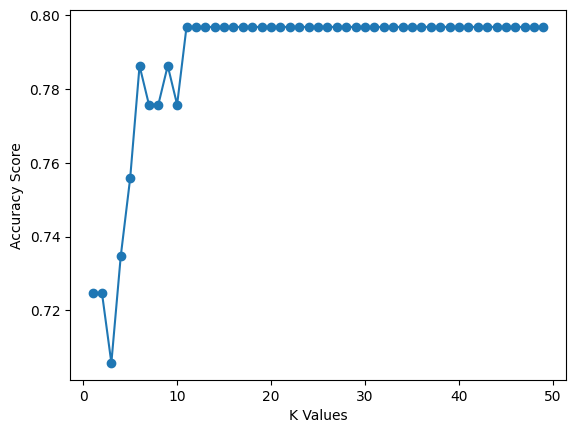

In [74]:
from sklearn.model_selection import cross_val_score
k_values = [i for i in range (1,50)]
scores = []

scaler = StandardScaler()
X = scaler.fit_transform(proj_2d)

for k in k_values:
    knn = KNeighborsClassifier(n_neighbors=k)
    score = cross_val_score(knn, X, y, cv=5)
    scores.append(np.mean(score))

plt.plot(k_values, scores, marker='o')
plt.xlabel("K Values")
plt.ylabel("Accuracy Score")
plt.savefig('../images/knn_players_k.png')

In [76]:
# Split the data into features (X) and target (y)
X = proj_2d
y = df_all['top_half']

iterations = 50
i = 0
accuracies = []
precisions = []
recalls = []

while i < iterations:
    # Split the data into training and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
    
    # Scale the features using StandardScaler
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    
    knn = KNeighborsClassifier(n_neighbors=11)
    knn.fit(X_train, y_train)
    
    y_pred = knn.predict(X_test)
    
    accuracies.append(accuracy_score(y_test, y_pred))
    precisions.append(metrics.precision_score(y_test, y_pred))
    recalls.append(metrics.recall_score(y_test, y_pred))

    i += 1

print("Accuracy:", np.average(accuracies))
print("Precision:", np.average(precisions))
print("Recall:", np.average(recalls))

Accuracy: 0.8140000000000001
Precision: 0.8290147630147631
Recall: 0.8140468420468419


## SVM

In [69]:
# Split the data into features and target
X = proj_2d
y = df_all['top_half']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# create classifier
clf = svm.SVC(kernel='linear') # Linear Kernel

# train model
clf.fit(X_train, y_train)

# predict labels for test data
y_pred = clf.predict(X_test)

accuracy = metrics.accuracy_score(y_test, y_pred)
precision = metrics.precision_score(y_test, y_pred)
recall = metrics.recall_score(y_test, y_pred)

# Create a mesh to plot decision boundaries
h = 0.02  # step size in the mesh
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                     np.arange(y_min, y_max, h))


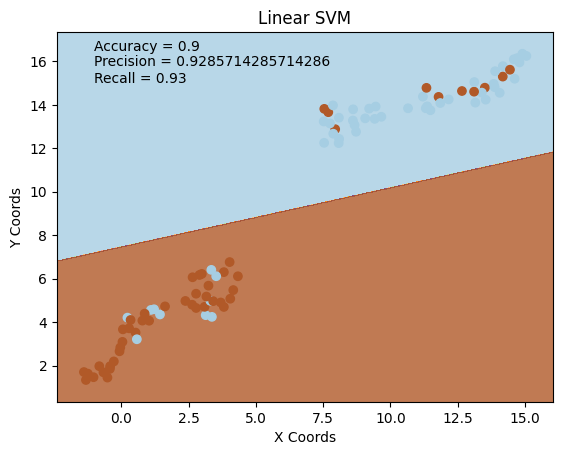

In [73]:

# Plot decision boundary of Linear SVM
Z_linear = clf.predict(np.c_[xx.ravel(), yy.ravel()])
Z_linear = Z_linear.reshape(xx.shape)
plt.contourf(xx, yy, Z_linear, cmap=plt.cm.Paired, alpha=0.8)
plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.Paired)
plt.title('Linear SVM')
plt.xlabel('X Coords')
plt.ylabel('Y Coords')
plt.xlim(xx.min(), xx.max())
plt.ylim(yy.min(), yy.max())
# Adding text without box on the plot.
plt.text(-1, 16.5, f'Accuracy = {accuracy}')
plt.text(-1, 15.8, f'Precision = {precision}')
plt.text(-1, 15, f'Recall = {round(recall,2)}')
plt.savefig('../images/svm_players.png')